In [2]:
from prompt_toolkit.input import Input
#Basierend auf 'https://github.com/BLarzalere/LSTM-Autoencoder-for-Anomaly-Detection/tree/master'
%load_ext tensorboard
%reload_ext tensorboard
%tensorboard --logdir logs/fit

ERROR: Failed to launch TensorBoard (exited with 1).
Contents of stderr:
Traceback (most recent call last):
  File "<frozen runpy>", line 198, in _run_module_as_main
  File "<frozen runpy>", line 88, in _run_code
  File "C:\Users\julik\anaconda3\Scripts\tensorboard.exe\__main__.py", line 4, in <module>
  File "C:\Users\julik\anaconda3\Lib\site-packages\tensorboard\main.py", line 27, in <module>
    from tensorboard import default
  File "C:\Users\julik\anaconda3\Lib\site-packages\tensorboard\default.py", line 37, in <module>
    from tensorboard.plugins.graph import graphs_plugin
  File "C:\Users\julik\anaconda3\Lib\site-packages\tensorboard\plugins\graph\graphs_plugin.py", line 30, in <module>
    from tensorboard.plugins.graph import keras_util
  File "C:\Users\julik\anaconda3\Lib\site-packages\tensorboard\plugins\graph\keras_util.py", line 45, in <module>
    from tensorboard.compat.tensorflow_stub import dtypes
  File "C:\Users\julik\anaconda3\Lib\site-packages\tensorboard\compat\t

# Anomalie Detection Filling Station

This Notebook is part of the Bachelors Thesis "Anomalieerkennung an industriellen Anlagen mit Long Short Term Memory Auto Encoder Netzwerken"

In [21]:
import pandas as pd
import numpy as np
import math
import datetime
import sklearn
from sklearn import metrics
import seaborn as sns
import matplotlib.pyplot as plt
%matplotlib inline

import tensorflow as tf
from keras.callbacks import EarlyStopping
from keras.optimizers import Adam

from keras.layers import Input, Dropout, Dense, LSTM, TimeDistributed, LayerNormalization, Bidirectional
from keras.models import Model

from timeserieslibrary.Preprocessing import TimeSeriesPreprocessingPipeline, to_multiple_timeseries_reverse
import timeserieslibrary.Learning_Rate_Schedule as lrs

sns.set(color_codes=True)

print("is GPU:",tf.config.list_physical_devices('GPU'))
print("is cuda:",tf.test.is_built_with_cuda())
print(tf.__version__)



is GPU: [PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU')]
is cuda: True
2.10.0


# Load the Data

In [4]:
###Load the Data###
#Trainings Data
data_normal_train1 = pd.read_csv("./Filling_Station/Daten/Normal/Normal.csv")
data_normal_train2 = pd.read_csv("./Filling_Station/Daten/Normal/Normal3.csv")
data_normal_train3 = pd.read_csv("./Filling_Station/Daten/Normal/Normal_Auslauf.csv")
data_normal_train4 = pd.read_csv("./Filling_Station/Daten/Normal/StartUp.csv")
data_normal_train5 = pd.read_csv("./Filling_Station/Daten/Normal/Normal_Wenig_Flaschen.csv")
#Combine all trainings data
data_normal_train = pd.concat((data_normal_train1, data_normal_train2, data_normal_train3, data_normal_train4, data_normal_train5))

#Normal Validation Data
data_normal_valid = pd.read_csv("./Filling_Station/Daten/Normal/Normal2.csv")

#Normal Test Data
data_test_normal = pd.read_csv("./Filling_Station/Daten/Normal/Normal4.csv")


#Anomalie Data
data_test_drehtisch_widerstand1=pd.read_csv("./Filling_Station/Daten/Anomalie/Rondel_Wiederstand.csv")
data_test_drehtisch_widerstand2=pd.read_csv("./Filling_Station/Daten/Anomalie/Rondel_Wiederstand2.csv")
data_test_drehtisch_widerstand = data_test_drehtisch_widerstand1 #pd.concat((data_test_drehtisch_widerstand1, data_test_drehtisch_widerstand2))
data_test_drehtisch_blockiert = pd.read_csv("./Filling_Station/Daten/Anomalie/Rondel_Blockiert.csv")
data_test_drehtisch_zu_wenig_widerstand = pd.read_csv("./Filling_Station/Daten/Anomalie/Rondel_zu_wenig_wiederstand.csv")
data_test_widerstand_transportband = pd.read_csv("./Filling_Station/Daten/Anomalie/Widerstand_Transport.csv")
data_test_widerstand_zufuerband = pd.read_csv("./Filling_Station/Daten/Anomalie/Wiederstand_Zuführ.csv")

#Cobine all test data
all_test_data = [data_test_normal, data_test_drehtisch_widerstand, data_test_drehtisch_blockiert, data_test_drehtisch_zu_wenig_widerstand, data_test_widerstand_transportband]
all_test_data_names=["Normal", "Drehtisch Widerstand",  "Drehtisch Blockiert", "Drehtisch zu wenig widerstand", "Transportband Widerstand"]

# Anzeigen der Daten

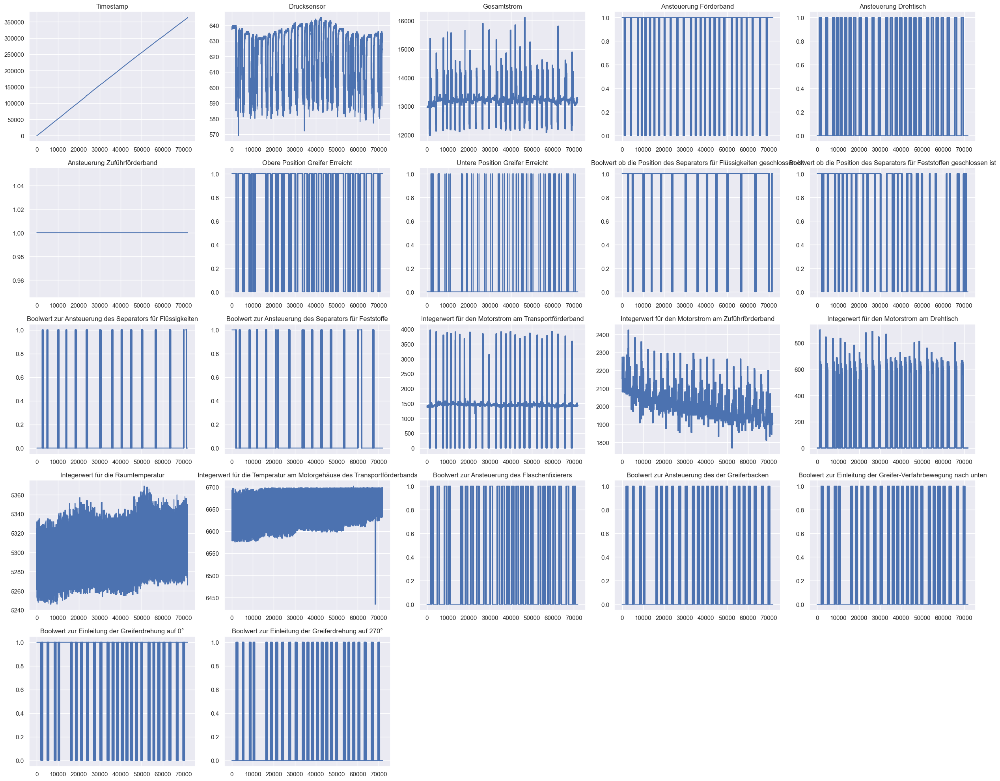

In [5]:
num_plots = data_test_normal.shape[1]

# Maximale Anzahl von Plots pro Zeile
cols = min(5, num_plots)
rows = math.ceil(num_plots / cols)  # Dynamisch berechnete Anzahl der Zeilen

fig, axes = plt.subplots(rows, cols, figsize=(5 * cols, 4 * rows))  # Grid erstellen

axes = axes.flatten()  # In 1D-Array umwandeln, damit `axes[i]` funktioniert

# Die Spaltennamen aus dem DataFrame holen
variable_names = data_test_normal.columns[:]

# Plots erstellen
for i, col_name in enumerate(variable_names):
    #axes[i].set_xlim([0, 500])
    axes[i].plot(data_test_normal.iloc[:, i])  # Richtige Spalte plotten
    axes[i].set_title(col_name)  # Variablennamen als Titel setzen

# Falls mehr Subplots vorhanden sind als benötigte Variablen, entferne leere Plots
for i in range(num_plots, len(axes)):
    fig.delaxes(axes[i])

plt.tight_layout()
plt.show()


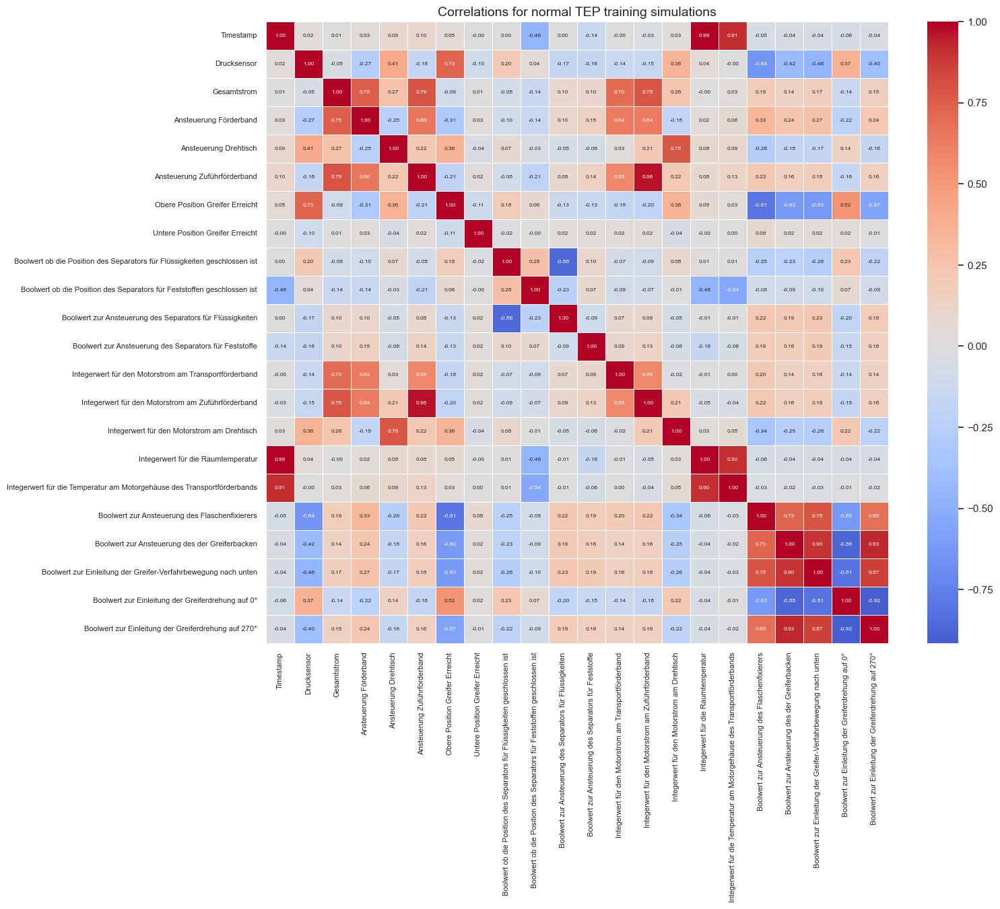

In [6]:
# Korrelationsmatrix
corr_matrix = data_normal_train.corr()
plt.figure(figsize=(15, 12))

sns.heatmap(corr_matrix, 
            annot=True, 
            fmt=".2f",
            cmap="coolwarm",
            center=0,
            linewidths=0.5, 
            square=True,
            annot_kws={"size": 6})  # Kleinere Schriftgröße für Werte

plt.xticks(rotation=90, fontsize=8)  # X-Achse drehen für bessere Lesbarkeit
plt.yticks(fontsize=8)  # Y-Achse kleiner machen
plt.title("Correlations for normal TEP training simulations", fontsize=14)
plt.show()

# Aufteilen der Daten inklusive Boolsche Werte deklarieren

In [7]:
print("Trainings Data Shape:", data_normal_train.shape)
print("Validation Data Shape:", data_normal_valid.shape)

for variable, testdata in enumerate(all_test_data):
    print(all_test_data_names[variable], "Test Data Shape:", testdata.shape)

Trainings Data Shape: (404296, 22)
Validation Data Shape: (108519, 22)
Normal Test Data Shape: (71926, 22)
Drehtisch Widerstand Test Data Shape: (24231, 22)
Drehtisch Blockiert Test Data Shape: (11164, 22)
Drehtisch zu wenig widerstand Test Data Shape: (14416, 22)
Transportband Widerstand Test Data Shape: (12636, 22)


In [8]:
print(data_normal_train.shape)
print(data_normal_valid.shape)
print(data_test_normal.shape)

(404296, 22)
(108519, 22)
(71926, 22)


In [9]:
print(data_test_drehtisch_widerstand.shape)
print(data_test_drehtisch_blockiert.shape)
print(data_test_drehtisch_zu_wenig_widerstand.shape)
print(data_test_widerstand_transportband.shape)

(24231, 22)
(11164, 22)
(14416, 22)
(12636, 22)


In [10]:
input_variablen = range(1,17,1)#
bool_variablen= [3,4,5,6,7,8,9,10,11,17,18,19,20,21]
ground_truth_variable= [2,12,14]
name_list = list(data_normal_valid.columns.values.tolist())

name_dict = {}
for variable in range(len(name_list)):
    name_dict[variable]=name_list[variable]

In [11]:
variablen_to_mask_index_list=[]
for variable in ground_truth_variable:
    variablen_to_mask_index_list += [np.where(np.array(input_variablen) == variable)]

print(variablen_to_mask_index_list)

[(array([1], dtype=int64),), (array([11], dtype=int64),), (array([13], dtype=int64),)]


In [12]:
ground_truth_name_list=[name_list[i] for i in ground_truth_variable]
ground_truth_variable_names = [name_dict[j] for j in ground_truth_variable]
print(ground_truth_variable_names)

['Gesamtstrom', 'Integerwert für den Motorstrom am Transportförderband', 'Integerwert für den Motorstrom am Drehtisch']


# Preprocess Data

In [13]:
###Preprocessing Data###

input_window=64
sliding_window_step=1
downsampling_faktor=64
mask_input_data=True
scale_data=True
add_time_stamp=True
data_multiplicator_for_masking = 4
data_mask_lenght=0.5

In [14]:
#Window_lenght_in_ms
original_sample_time=6
window_time=original_sample_time*downsampling_faktor*input_window
print("window time", np.round(window_time/1000, 2))

window time 24.58


In [15]:
ts_processing = TimeSeriesPreprocessingPipeline(  split_time_series_into_window_of_len=input_window,
                                             input_variable_index_list=input_variablen,
                                             downsampling_faktor=downsampling_faktor,
                                             index_list_bool_variablen=bool_variablen,
                                             sliding_window_step=sliding_window_step,
                                             add_time_stamp=add_time_stamp,
                                             scale_data=scale_data,
                                             ground_truth_variable_index_list=ground_truth_variable,
                                             mask_input_data=mask_input_data,
                                             data_mask_lenght=data_mask_lenght,
                                             data_multiplicator_for_masking=data_multiplicator_for_masking,
                                             )


x_train, y_train = ts_processing(data_normal_train, is_test_data=False)
x_valid, y_valid = ts_processing(data_normal_valid, is_test_data=True)

ts_processing.save_config_as_JSON()


Input data shape: (404296, 22)
Shape of x data (25020, 64, 17)
Shape of y data (25020, 64, 3)

Input data shape: (108519, 22)
Shape of x data (1633, 64, 17)
Shape of y data (1633, 64, 3)


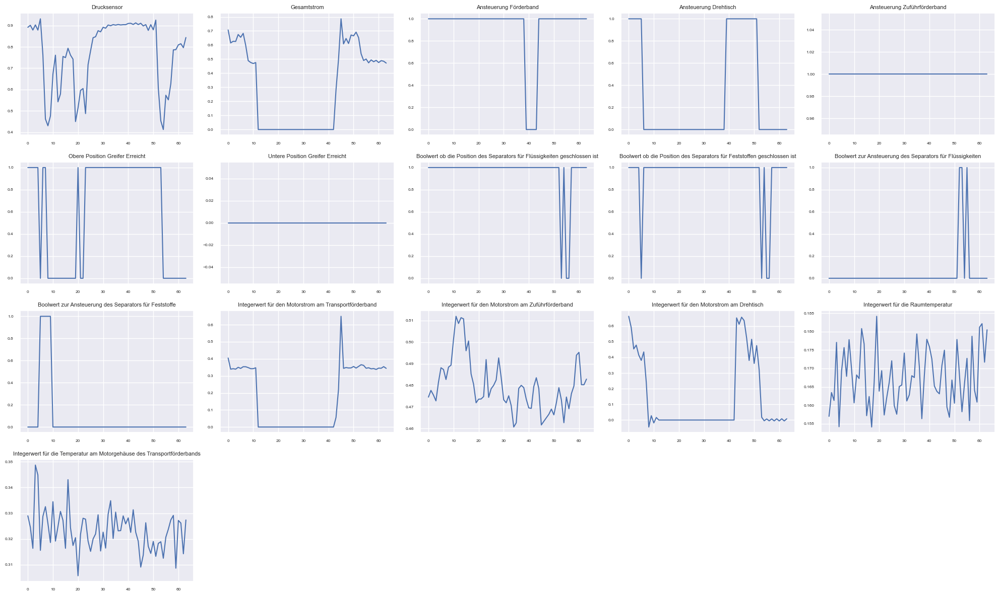

In [16]:
num_plots = data_normal_train.shape[-1] - 6  # Anzahl der Variablen
cols = min(5, num_plots)  # Maximal 5 Plots pro Zeile
rows = math.ceil(num_plots / cols)  # Berechnet die benötigte Anzahl an Zeilen

fig, axes = plt.subplots(rows, cols, figsize=(4 * cols, 3 * rows))  # Kleinere Plots

axes = axes.flatten()  # Falls es eine 2D-Array von Subplots gibt, in 1D umwandeln

for i, variable in enumerate(range(num_plots)):
    var_name = name_list[input_variablen[variable]]
    
    axes[i].plot(x_train[1, :, variable])  # Linien-Plot wie vorher
    axes[i].set_title(var_name, fontsize=8)  # Kleinere Schriftgröße
    axes[i].tick_params(axis='both', labelsize=6)  # Kleinere Achsenbeschriftungen

# Leere Plots entfernen, falls es mehr Subplots als Variablen gibt
for i in range(num_plots, len(axes)):
    fig.delaxes(axes[i])

plt.tight_layout()  # Sorgt für bessere Anordnung der Plots
plt.show()


In [17]:
test_data_preprocessed_x = []
test_data_preprocessed_y= []
for variable in all_test_data:
    x_, y_= ts_processing(variable, stride_of_window = 1, is_test_data=True)
    test_data_preprocessed_x += [np.array(x_,dtype=np.float32)]
    test_data_preprocessed_y += [np.array(y_,dtype=np.float32)]


Input data shape: (71926, 22)
Shape of x data (1061, 64, 17)
Shape of y data (1061, 64, 3)

Input data shape: (24231, 22)
Shape of x data (316, 64, 17)
Shape of y data (316, 64, 3)

Input data shape: (11164, 22)
Shape of x data (112, 64, 17)
Shape of y data (112, 64, 3)

Input data shape: (14416, 22)
Shape of x data (163, 64, 17)
Shape of y data (163, 64, 3)

Input data shape: (12636, 22)
Shape of x data (135, 64, 17)
Shape of y data (135, 64, 3)


# Show preprocessed data 

Variable: Integerwert für den Motorstrom am Transportförderband


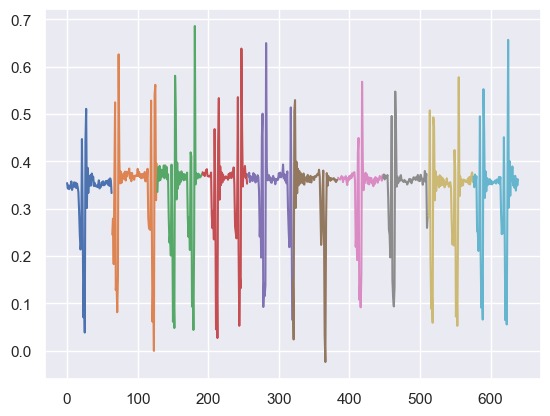

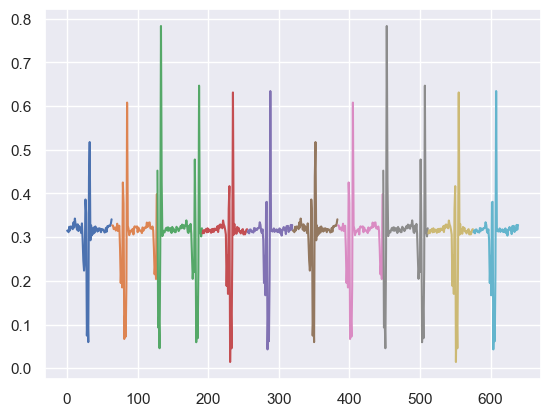

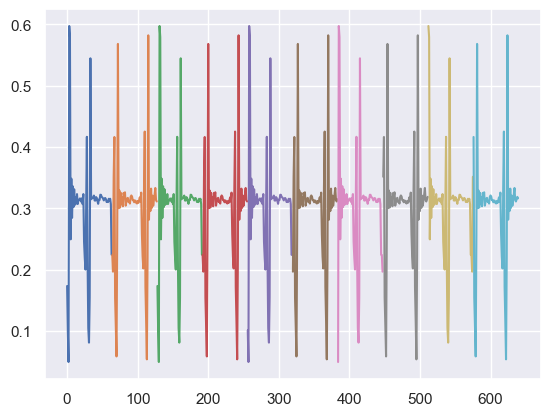

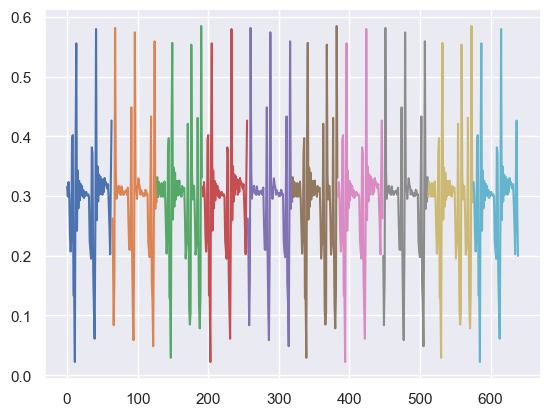

In [18]:
### Show preprocessed Data ###
variable = 1

print("Variable:", name_list[ground_truth_variable[variable]])
for window in range(10):
    x__=np.arange(window*input_window,(window+1)*input_window)
    plt.plot(x__,test_data_preprocessed_y[0][window,:,variable])
plt.show()
for window in range(10):
    x__=np.arange(window*input_window,(window+1)*input_window)
    plt.plot(x__,test_data_preprocessed_y[1][window,:,variable])
plt.show()

for window in range(10):
    x__=np.arange(window*input_window,(window+1)*input_window)
    plt.plot(x__,test_data_preprocessed_y[2][window,:,variable])
plt.show()
for window in range(10):
    x__=np.arange(window*input_window,(window+1)*input_window)
    plt.plot(x__,test_data_preprocessed_y[3][window,:,variable])
plt.show()

# Create Model 

In [19]:
def autoencoder_model(input_shape):
    inputs = Input(shape=input_shape)

    # **Encoder**
    encoded = Bidirectional(LSTM(64, return_sequences=True))(inputs)
    encoded = LayerNormalization()(encoded)
    encoded = Dropout(0.3)(encoded)
    
    encoded = Bidirectional(LSTM(32, return_sequences=True))(encoded)
    
    encoded = Bidirectional(LSTM(16, return_sequences=True))(encoded) 

    # **Decoder**
    decoded = Bidirectional(LSTM(16, return_sequences=True))(encoded)
    decoded = LayerNormalization()(decoded)
    decoded = Dropout(0.3)(decoded)
    
    decoded = Bidirectional(LSTM(32, return_sequences=True))(decoded)

    decoded = Bidirectional(LSTM(64, return_sequences=True))(decoded)
    
    outputs = TimeDistributed(Dense(y_train.shape[-1]))(decoded)

    model = Model(inputs=inputs, outputs=outputs)
    return model


In [22]:
batch_size = 64

#Learning rate schedule
steps_per_epoch = (len(x_train) // batch_size)
learning_rate = lrs.CosineDecayWithWarmup(steps_per_epoch*4,5e-4,steps_per_epoch*45)
optimizer = tf.keras.optimizers.Adam(learning_rate, beta_1=0.9, beta_2=0.98) 

#lr_scheduler = CosineDecay(initial_learning_rate=initial_learning_rate, decay_steps=decay_steps)
#optimizer = Adam(learning_rate=learning_rate)  # Changed optimizer to Adam

# Modell erstellen und kompilieren
model = autoencoder_model((x_train.shape[1], x_train.shape[2]))
model.compile(optimizer=optimizer, loss='mse')
model.summary()


Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 input_2 (InputLayer)        [(None, 64, 17)]          0         
                                                                 
 bidirectional_1 (Bidirectio  (None, 64, 128)          41984     
 nal)                                                            
                                                                 
 layer_normalization (LayerN  (None, 64, 128)          256       
 ormalization)                                                   
                                                                 
 dropout (Dropout)           (None, 64, 128)           0         
                                                                 
 bidirectional_2 (Bidirectio  (None, 64, 64)           41216     
 nal)                                                            
                                                             

In [23]:
# fit the model to the data
nb_epochs = 100

# Callbacks
early_stopping = EarlyStopping(monitor='val_loss', patience=10, restore_best_weights=True)


log_dir = "logs/fit/" + datetime.datetime.now().strftime("%Y%m%d-%H%M%S")
tensorboard_callback = tf.keras.callbacks.TensorBoard(log_dir=log_dir, histogram_freq=1)


history = model.fit(x_train, y_train, epochs=nb_epochs, batch_size=batch_size,
                    validation_split=0.05, callbacks=[early_stopping], verbose=2).history

Epoch 1/100
372/372 - 26s - loss: 0.0368 - val_loss: 0.0075 - 26s/epoch - 71ms/step
Epoch 2/100
372/372 - 13s - loss: 0.0062 - val_loss: 0.0038 - 13s/epoch - 36ms/step
Epoch 3/100
372/372 - 14s - loss: 0.0032 - val_loss: 0.0019 - 14s/epoch - 36ms/step
Epoch 4/100
372/372 - 13s - loss: 0.0020 - val_loss: 0.0014 - 13s/epoch - 36ms/step
Epoch 5/100
372/372 - 13s - loss: 0.0016 - val_loss: 0.0011 - 13s/epoch - 36ms/step
Epoch 6/100
372/372 - 13s - loss: 0.0013 - val_loss: 0.0010 - 13s/epoch - 36ms/step
Epoch 7/100
372/372 - 13s - loss: 0.0011 - val_loss: 8.8912e-04 - 13s/epoch - 36ms/step
Epoch 8/100
372/372 - 13s - loss: 0.0010 - val_loss: 8.1796e-04 - 13s/epoch - 36ms/step
Epoch 9/100
372/372 - 13s - loss: 9.4577e-04 - val_loss: 7.3137e-04 - 13s/epoch - 36ms/step
Epoch 10/100
372/372 - 13s - loss: 8.7014e-04 - val_loss: 6.8536e-04 - 13s/epoch - 36ms/step
Epoch 11/100
372/372 - 13s - loss: 8.1171e-04 - val_loss: 6.1632e-04 - 13s/epoch - 36ms/step
Epoch 12/100
372/372 - 13s - loss: 7.6553e

# Evaluation

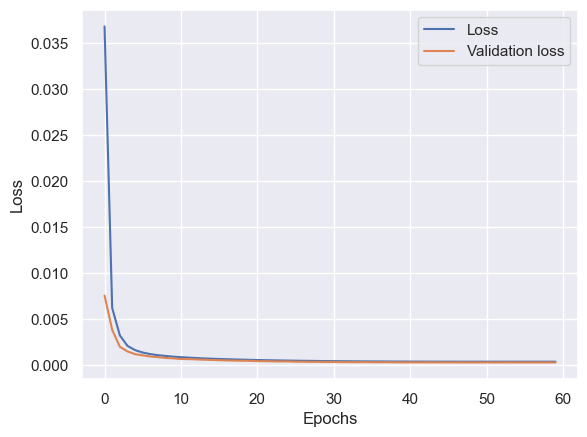

In [24]:
plt.plot(history['loss'], label='Loss')
plt.plot(history['val_loss'], label='Validation loss')
plt.xlabel("Epochs")
plt.ylabel("Loss")
plt.legend()
plt.show()

# Reconstruction Error

In [25]:
for variable in range(len(test_data_preprocessed_x)):
    print(all_test_data_names[variable])
    model.evaluate(test_data_preprocessed_x[variable], test_data_preprocessed_y[variable])


Normal
34/34 [==============================] - 1s 23ms/step - loss: 0.0031
Drehtisch Widerstand
10/10 [==============================] - 0s 19ms/step - loss: 0.0240
Drehtisch Blockiert
4/4 [==============================] - 0s 21ms/step - loss: 0.1666
Drehtisch zu wenig widerstand
6/6 [==============================] - 0s 21ms/step - loss: 0.0166
Transportband Widerstand
5/5 [==============================] - 0s 21ms/step - loss: 0.0128


# Reconstruction of normal test data

34/34 [==============================] - 3s 22ms/step
normal test Data
(1024, 3)
(960,)
Variable: Gesamtstrom


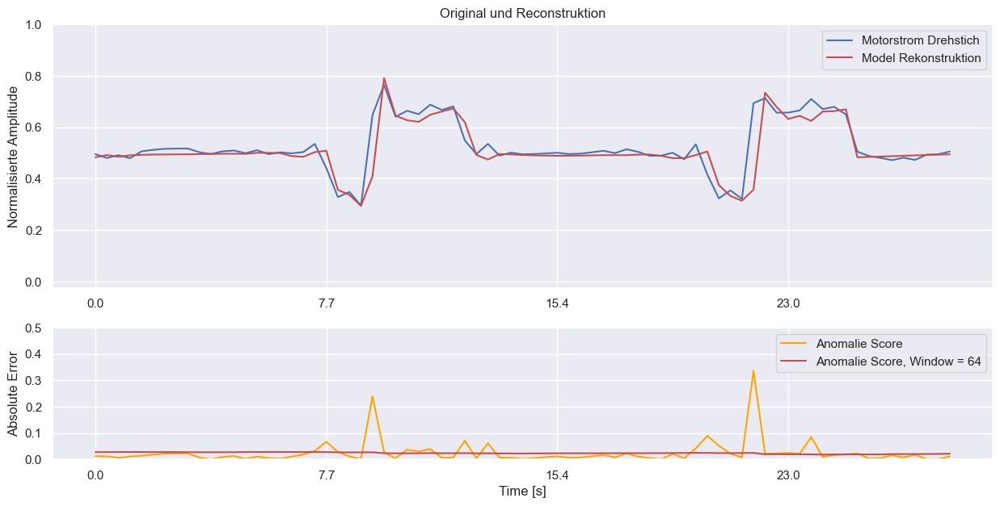

(960,)
Variable: Integerwert für den Motorstrom am Transportförderband


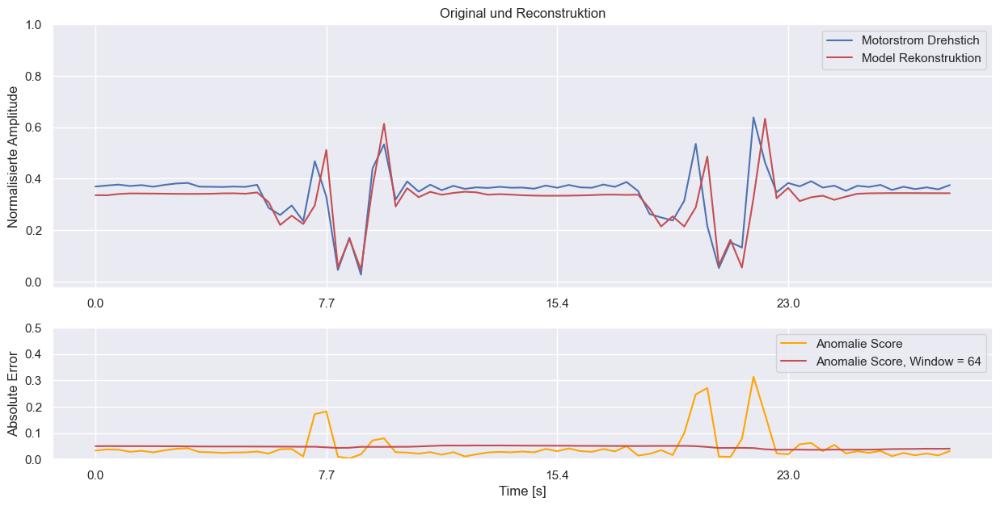

(960,)
Variable: Integerwert für den Motorstrom am Drehtisch


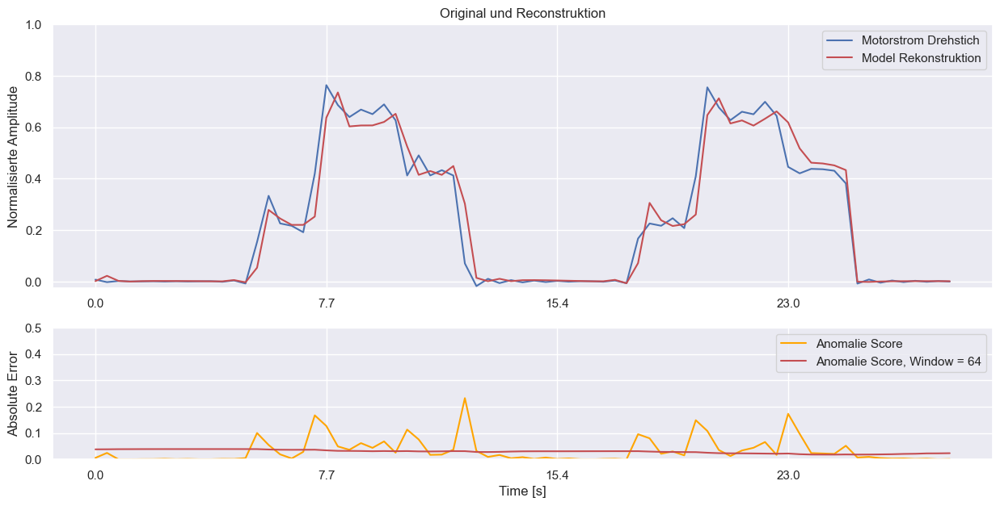

In [26]:
prediction_normal = model.predict(test_data_preprocessed_x[0])
y_normal = test_data_preprocessed_y[0]
prediction_reconstruct=to_multiple_timeseries_reverse(prediction_normal, stride_of_window=1)
y_reconstruct=to_multiple_timeseries_reverse(y_normal, stride_of_window=1)


plt.rcParams['figure.figsize'] = [15, 7]
range_l = 190
range_u = 265

print("normal test Data")

print(prediction_reconstruct.shape)
for variable in range(prediction_reconstruct.shape[-1]):

    mean=[]
    window=64
    for l in range(len(y_reconstruct)-window):
        mean += [np.mean(np.abs(prediction_reconstruct[l:l+window,variable]-y_reconstruct[l:l+window,variable]))]

    mean = np.array(mean)
    print(mean.shape)


    fig, ax = plt.subplots(2, height_ratios=[2,1])
    print("Variable:", name_list[ground_truth_variable[variable]])
    ax[0].plot(y_reconstruct[range_l:range_u,variable], "b")
    ax[0].plot(prediction_reconstruct[range_l:range_u,variable], "r")
    ax[0].legend(["Motorstrom Drehstich", "Model Rekonstruktion"])#[name_list[ground_truth_variable[i]], str(name_list[ground_truth_variable[i]]) + " Prediction"])
    ax[0].set_ylabel("Normalisierte Amplitude")
    ax[0].title.set_text('Original und Reconstruktion')
    #fig.title("Drehstich ohne Anomalie")
    ax[0].set_ylim(-0.025, 1)
    time=np.arange(0,range_u-range_l,20)
    ax[0].set_xticks(time, np.round((time*384)/1000, 1))


    ax[1].plot(np.abs(y_reconstruct[range_l:range_u,variable]-prediction_reconstruct[range_l:range_u,variable]), "orange")
    ax[1].plot(mean[range_l:range_u], "r")
    
    ax[1].set_ylim(0, 0.5)
    ax[1].set_xticks(time, np.round((time*384)/1000, 1))

    ax[1].set_ylabel("Absolute Error")
    ax[1].set_xlabel("Time [s]")
    ax[1].legend(["Anomalie Score", "Anomalie Score, Window = 64"])
    
    plt.show()


# Reconstruction of anomalie test data for each Anomalie

Plot one window of all variable of all anomalie classes

10/10 [==============================] - 0s 29ms/step
(256, 3)
(256, 3)
Anomlie: Drehtisch Widerstand
Variable: Gesamtstrom
(192,)


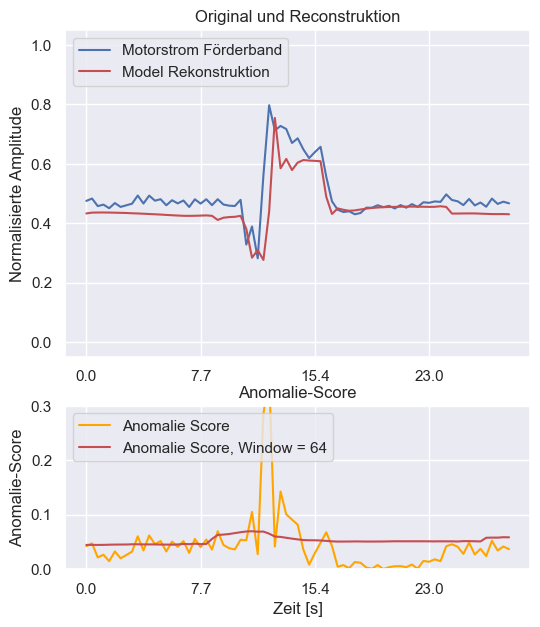

Variable: Integerwert für den Motorstrom am Transportförderband
(192,)


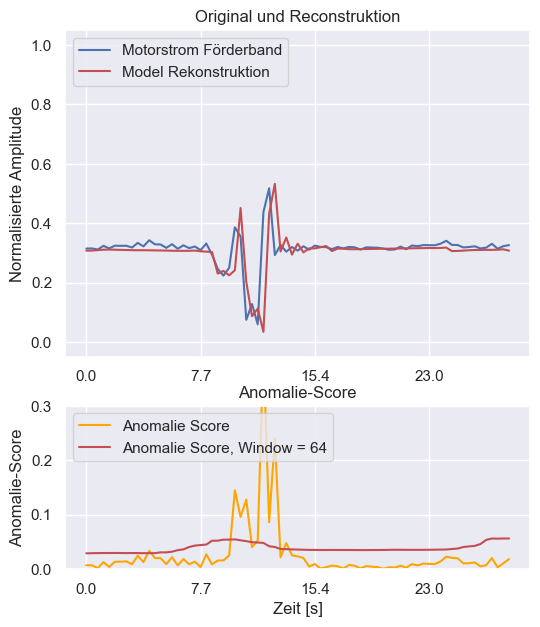

Variable: Integerwert für den Motorstrom am Drehtisch
(192,)


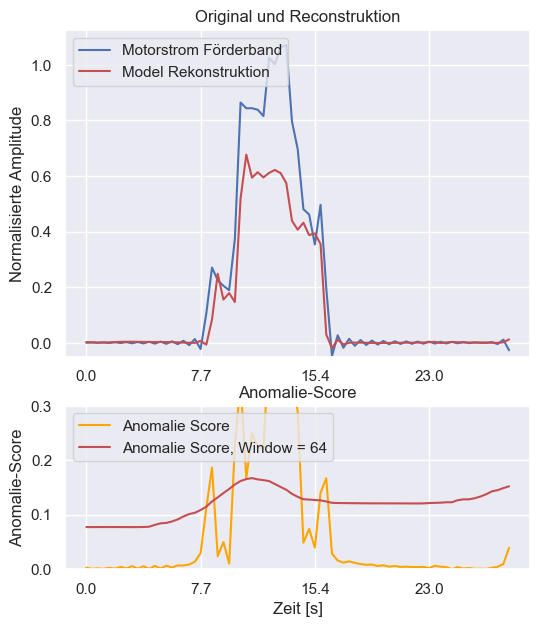

4/4 [==============================] - 0s 18ms/step
(64, 3)
(64, 3)
Anomlie: Drehtisch Blockiert
Variable: Gesamtstrom
(0,)


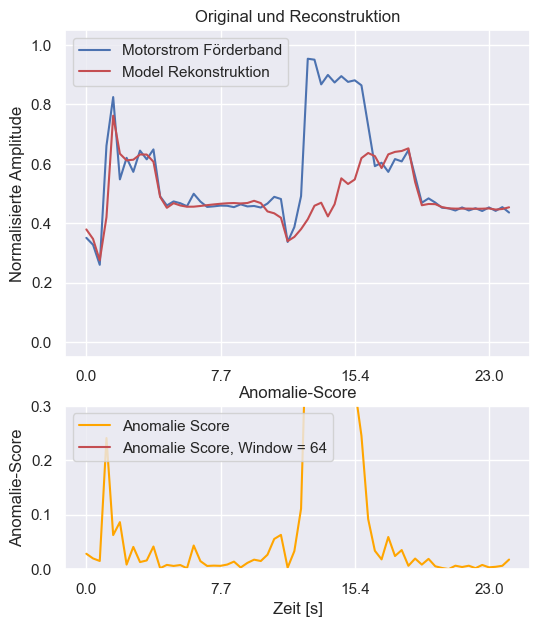

Variable: Integerwert für den Motorstrom am Transportförderband
(0,)


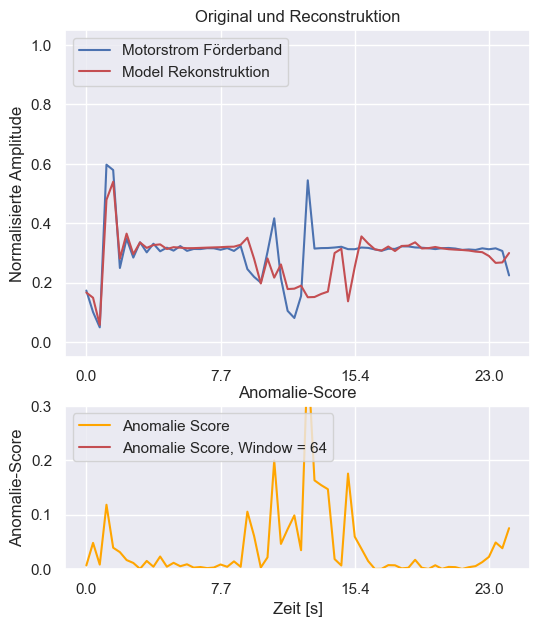

Variable: Integerwert für den Motorstrom am Drehtisch
(0,)


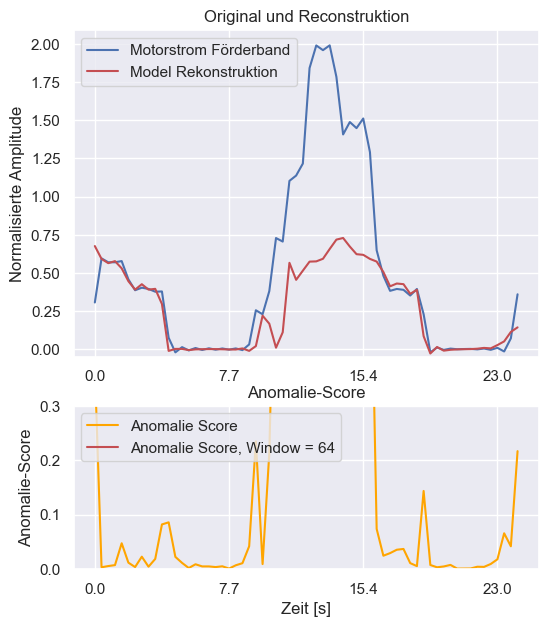

6/6 [==============================] - 0s 18ms/step
(128, 3)
(128, 3)
Anomlie: Drehtisch zu wenig widerstand
Variable: Gesamtstrom
(64,)


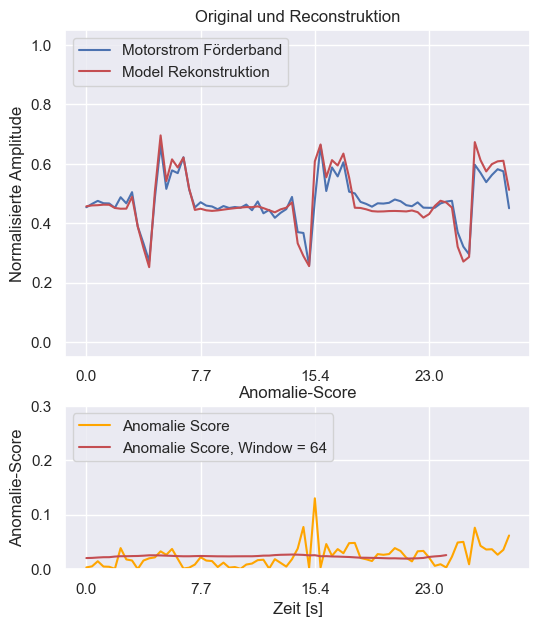

Variable: Integerwert für den Motorstrom am Transportförderband
(64,)


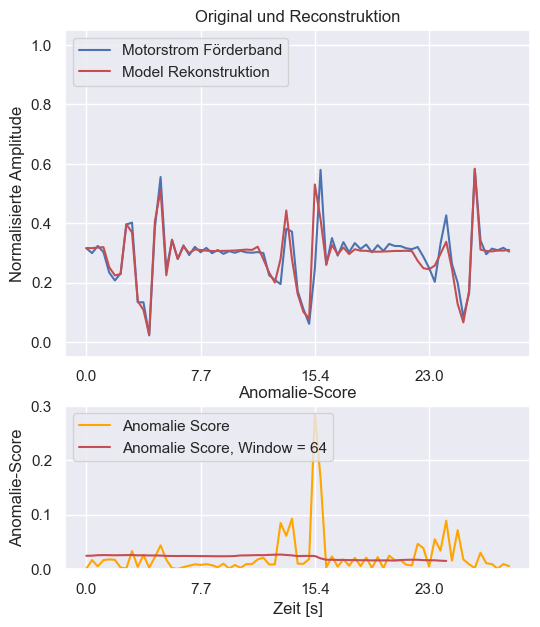

Variable: Integerwert für den Motorstrom am Drehtisch
(64,)


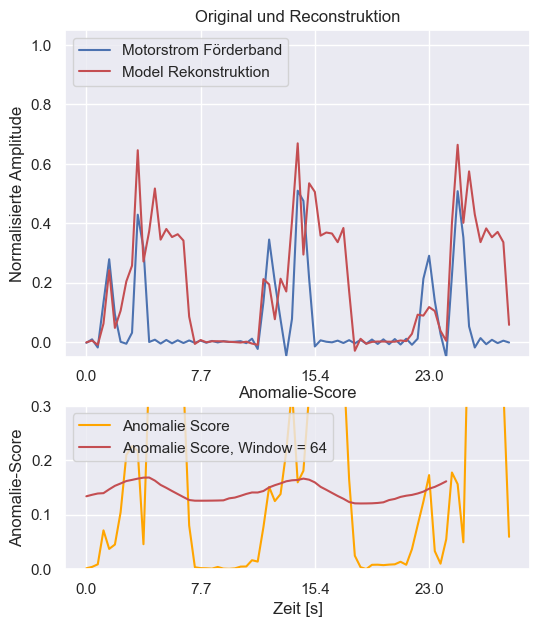

5/5 [==============================] - 0s 18ms/step
(128, 3)
(128, 3)
Anomlie: Transportband Widerstand
Variable: Gesamtstrom
(64,)


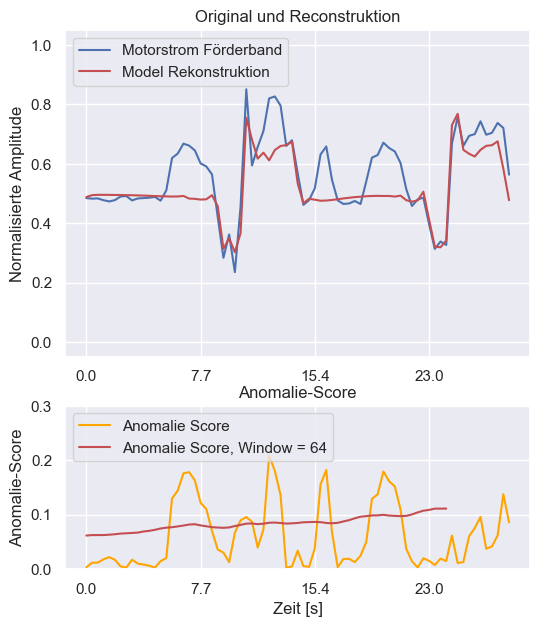

Variable: Integerwert für den Motorstrom am Transportförderband
(64,)


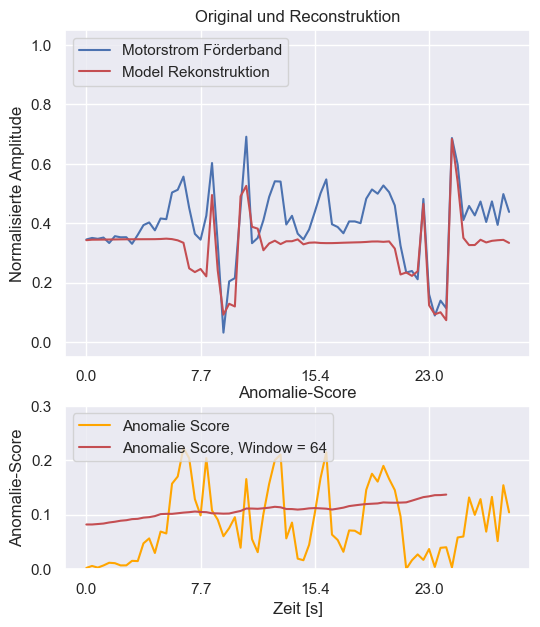

Variable: Integerwert für den Motorstrom am Drehtisch
(64,)


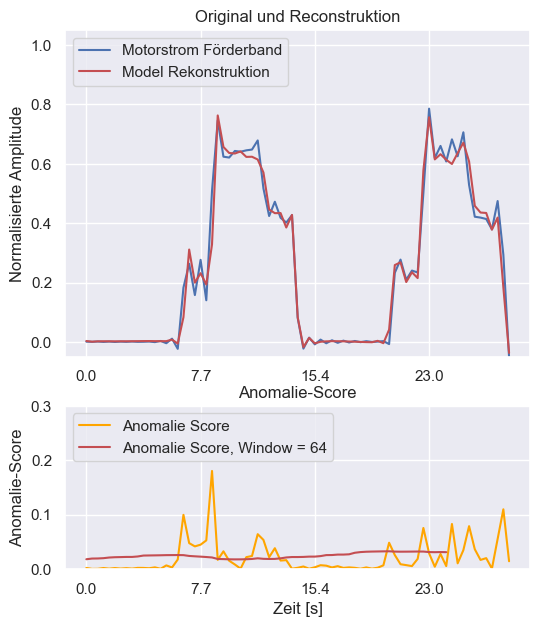

In [27]:
plt.rcParams['figure.figsize'] = [6, 7]
test_data_anaomlie_prediction=[]
test_data_anomalie_y=[]

range_l = 0
range_u = 75

for variable in range(1,len(test_data_preprocessed_x)):
    
    test_data_anaomlie_prediction += [model.predict(test_data_preprocessed_x[variable])]
    test_data_anomalie_y += [test_data_preprocessed_y[variable]]

    prediction_reconstruct=to_multiple_timeseries_reverse(test_data_anaomlie_prediction[variable-1], stride_of_window=1)
    y_reconstruct=to_multiple_timeseries_reverse(test_data_anomalie_y[variable-1], stride_of_window=1)
    print(y_reconstruct.shape)

    mean=[]
    
   

    print(prediction_reconstruct.shape)
    print("Anomlie:", all_test_data_names[variable])
    for j in range(prediction_reconstruct.shape[-1]):
        print("Variable:", name_list[ground_truth_variable[j]])


        mean=[]
        window=64
        for l in range(len(y_reconstruct)-window):
            mean += [np.mean(np.abs(prediction_reconstruct[l:l+window,j]-y_reconstruct[l:l+window,j]))]

        mean = np.array(mean)
        print(mean.shape)


        fig, ax = plt.subplots(2, height_ratios=[2,1])
   
        ax[0].set_ylim([-0.05, np.max(np.append(1, np.max(y_reconstruct[range_l:range_u,j]))*1.05 )])
        ax[0].plot(y_reconstruct[range_l:range_u,j], "b")
        ax[0].plot(prediction_reconstruct[range_l:range_u,j], "r")
        ax[0].set_xticks(time, np.round((time*384)/1000, 1))
        ax[0].title.set_text('Original und Reconstruktion')
        ax[0].legend(["Motorstrom Förderband", "Model Rekonstruktion"], loc="upper left")#[name_list[ground_truth_variable[i]], str(name_list[ground_truth_variable[i]]) + " Prediction"])
        time=np.arange(0,range_u-range_l,20)
        plt.xlabel("Zeit [s]")
        ax[0].set_ylabel("Normalisierte Amplitude")       





        ax[1].plot(np.abs(y_reconstruct[range_l:range_u,j]-prediction_reconstruct[range_l:range_u,j]), "orange")
        ax[1].plot(mean[range_l:range_u], "r")
        ax[1].title.set_text('Anomalie-Score')
        ax[1].set_ylabel("Anomalie-Score")     
        ax[1].legend(["Anomalie Score", "Anomalie Score, Window = 64"], loc="upper left")
        ax[1].set_ylim(0,0.3)

        time=np.arange(0,range_u-range_l,20)
        plt.xticks(time, np.round((time*384)/1000, 1))
        plt.show()
    

In [28]:
#Input dim: (sample, timeseries window) or (sample, timeseries window, variable) 
def calculate_mse(prediction, y, add_mse_fromEach_variable=False): 
    mse=[]
    print(prediction.shape, y.shape)

    if len(prediction.shape)==2:
        mse=[]
        for i in range(len(prediction)):
            mse += [np.mean( np.square(prediction[i]-y[i]))]
    elif len(prediction.shape)==3:
        for sample in range(prediction.shape[0]):
            tmp=[]
            for variable in range(y.shape[-1]):
                tmp += [np.mean( np.square(prediction[sample,:,variable]-y[sample,:,variable]))]
            mse += [tmp]
        if add_mse_fromEach_variable:
            added_mse=[]
            for i in range(len(mse)):
                added_mse += [np.mean(mse[i])]
            
            mse=added_mse

    else:
        raise Exception("Dimension error")

    return np.array(mse)

In [29]:
mse_normal = calculate_mse(prediction_normal, test_data_preprocessed_y[0])

(1061, 64, 3) (1061, 64, 3)


In [30]:
mse_anomlie=[]
for variable in range(len(test_data_anaomlie_prediction)):
    mse_anomlie += [calculate_mse(test_data_anaomlie_prediction[variable], test_data_anomalie_y[variable])]


(316, 64, 3) (316, 64, 3)
(112, 64, 3) (112, 64, 3)
(163, 64, 3) (163, 64, 3)
(135, 64, 3) (135, 64, 3)


# Precision-Recall and Histogram of Anomalie-Score

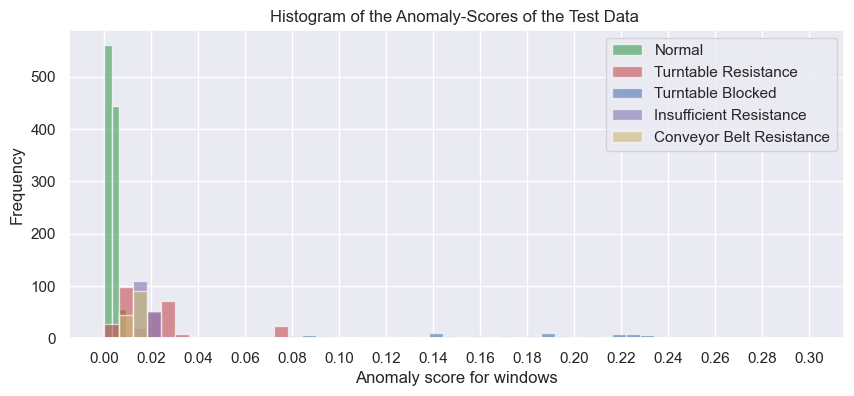

AUCPR: 0.9940513018201009


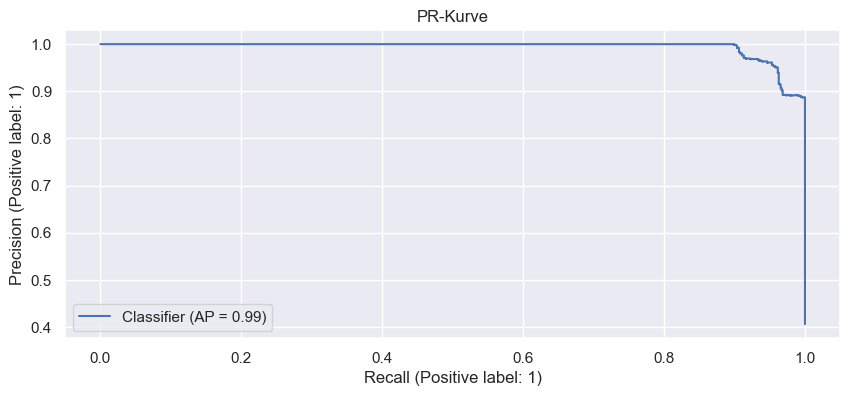

In [31]:
plot_range=[0.00, 0.3]
plt.rcParams['figure.figsize'] = [10, 4]
density=False
colors=["r","b", "m", "y", "c", "black"]

plt.hist(np.mean(mse_normal[:,:],axis=-1),bins = 100,density= density, range=plot_range,color="g",alpha=0.7,log=False, )

for j in range(len(mse_anomlie)):
     mse_mean_over_variablen=np.mean(mse_anomlie[j][:,:],axis=-1)

     for variable in range(len(mse_mean_over_variablen)):
          if mse_mean_over_variablen[variable] > plot_range[-1]:
               mse_mean_over_variablen[variable] = plot_range[-1]

     plt.hist(mse_mean_over_variablen,bins = 50,density= density, range=plot_range,alpha=0.6,log=False, color=colors[j])



plt.legend( ['Normal', 'Turntable Resistance', 'Turntable Blocked', 'Insufficient Resistance', 'Conveyor Belt Resistance'])
plt.locator_params(axis='x', nbins=20)
plt.ylabel("Frequency")
plt.xlabel("Anomaly score for windows")
plt.title("Histogram of the Anomaly-Scores of the Test Data ")
plt.show()
mse_normal_mean=np.mean(mse_normal[:,:], axis=-1)

mse_anomal_sum=np.array(np.mean(mse_anomlie[0][:,:], axis=-1))
for j in range(1,len(mse_anomlie)):
     mse_anomal_sum=np.append(mse_anomal_sum, np.mean(mse_anomlie[j][:,:], axis=-1), axis=-1)

label_n = np.zeros(len(mse_normal_mean))
label_a = np.ones(len(mse_anomal_sum))
y_score=np.append(mse_normal_mean,mse_anomal_sum)
y_test=np.append(label_n,label_a)


precision, recall, thresholds = metrics.precision_recall_curve(y_test, y_score)
auc_precision_recall = metrics.auc(recall, precision)
print("AUCPR:",auc_precision_recall)
sklearn.metrics.PrecisionRecallDisplay.from_predictions(y_test, y_score)
#plt.xlabel("Precsision TP/(TP+FP)")
#plt.ylabel("Recall TP/(TP+FN)")    
plt.title("PR-Kurve")
plt.show()


In [32]:
normal_score = np.mean(mse_normal[:,:],axis=-1)
anormal_score =  np.append(np.append(np.mean(mse_anomlie[0][:,:],axis=-1),np.mean(mse_anomlie[1][:,:])) , np.mean(mse_anomlie[2][:,:]) )

scores = np.append( normal_score, anormal_score)
label = np.append( np.zeros(len(normal_score)) ,np.ones(len(anormal_score)) )


In [33]:
mean_score=scores
thresholds_for_f1=np.arange(0,0.1,0.0001)
anomalie_pred_fro_each_threshold=[]
anomalie_pred_fro_each_threshold= [[0 if (mse<threshold) else 1 for mse in mean_score] for threshold in thresholds_for_f1]

f1_scores=[]
for anomalies_for_each_treshold in anomalie_pred_fro_each_threshold: 
    f1_scores+=[sklearn.metrics.f1_score(label, anomalies_for_each_treshold)]


    #print("\n")

print("threshold",thresholds_for_f1[np.argmax(f1_scores)])
print("best f1", max(f1_scores))

threshold 0.0067
best f1 0.8987341772151899


In [34]:
list_of_thresholds = []

for i in range(np.array(mse_normal).shape[-1]):

    list_of_thresholds+=[np.max(mse_normal[:,i])]


# Define thresholds for each variable

In [35]:
np.float64(list_of_thresholds)

array([0.00745588, 0.01114118, 0.00931742])

In [36]:
list_of_thresholds[0] = list_of_thresholds[0] * 1.2
list_of_thresholds[1] = list_of_thresholds[1] * 1.5
list_of_thresholds[2] = list_of_thresholds[2] * 1.5

In [37]:
np.float64(list_of_thresholds)

array([0.00894706, 0.01671177, 0.01397613])

In [38]:
import json

if True:

    model.save("Model")
    
    data=0
    file = open("config.json", "r")
    data = json.load(file)
    file.close()

    new_data={
        "thresholds": dict(zip(range(len(list_of_thresholds)), np.float64(list_of_thresholds) )) ,
        "ground_truth_name_list": dict(zip(range(len(ground_truth_name_list)), ground_truth_name_list)),
        "sliding_window_stride_deployment": 8
    }    
    
    data.update(new_data)

    with open("config.json", "w") as file:  
        json.dump(data, file, indent=2)
        file.close()       


INFO:tensorflow:Assets written to: Model\assets


INFO:tensorflow:Assets written to: Model\assets


# Auswertung des f1 Score und AUCPR Wert

Mehrere Durchläufe mit dem gleichen Modell und die unterschiedlichen Ergebnisse in eine Tabelle schreiben und vergleichen und das beste Ergebnis Highlighten
Danach das Modell leicht anpassen (unterschiedliche komplex) und die unterschiedlichen Ergebnisse in die Liste um die unterschiedlichen Ergebnisse zu vergleichen und wieder das beste Highlighten

Sinn der Tabelle ist der gesamte Vergleich von LSTM-AE, LSTM-VAE und LSTM_AE mit Attention Layer. Dadurch ergebniss: LSTM_AE ist gut, LSTM-VAE ist zu mächtig weil Anomalien vernachlässigt werden durch anpassung des Thresholds. Dafür jedoch LSTM-AE mit Attention sehr gut und die Rekonstruktion am besten

In der Tabelle dann Alle Modelle vergleichen und dadurch das beste rausfinden, jedoch innerhlab des Modells auch die beste komplexität zeigen